# Estimated Building Hieght based on shadow lenght using open source OBIA
## By/ Sahar Mohamed
### Earth Observation Application Development Class

### Define Segmentation using nickyspatial package

In [1]:
!pip install nickyspatial

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/8.1 MB ? eta -:--:--
   -------------------------------------- - 7.9/8.1 MB 44.2 MB/s eta 0:00:01
   ---------------------------------------- 8.1/8.1 MB 29.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/11.0 MB ? eta -:--:--
   ---------------------------------------  10.7/11.0 MB 56.1 MB/s eta 0:00:01
   ---------------------------------------- 11.0/11.0 MB 40.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/9.6 MB ? eta -:--:--
   ---------------------------------------- 9.6/9.6 MB 75.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/12.9 MB ? eta -:--:--
   ------------------------------------ --- 11.8/12.9 MB 61.7 MB/s eta 0:00:01
   ---------------------------------------- 12.9/12.9 MB 35.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/8.7 MB ? eta -:--:--
   -------------------------

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  You can safely remove it manually.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  You can safely remove it manually.
  You can safely remove it manually.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.16.1 which is incompatible.


In [5]:
import os
import numpy as np
from nickyspatial import (
    LayerManager,
    read_raster,
    SlicSegmentation,
    plot_layer 
)

def run_slic_segmentation(raster_path, output_dir, scale=40.0, compactness=0.5):
    """
    Runs OBIA segmentation using SLIC on a given raster and saves the output image.

    Parameters:
        raster_path (str): Path to the input raster image.
        output_dir (str): Directory where the output image will be saved.
        scale (float): Scale parameter for SLIC segmentation.
        compactness (float): Compactness parameter for SLIC segmentation.
    """
    # Step 1: Read raster
    print(f"Reading raster from: {raster_path}")
    image_array, transform, crs = read_raster(raster_path)
    print(f"Original image shape: {image_array.shape} (bands, height, width)")
    print(f"CRS: {crs}")

    # Step 2: OBIA segmentation
    print("Running OBIA segmentation using SlicSegmentation...")
    manager = LayerManager()
    segmenter = SlicSegmentation(scale=scale, compactness=compactness)

    segmentation_layer = segmenter.execute(
        image_array,
        transform,
        crs,
        layer_manager=manager,
        layer_name="buildings_OBIA_Segments"
    )

    print("Segmentation complete.")
    print(segmentation_layer)

    # Step 3: Prepare RGB image for visualization
    image_array_rgb = np.moveaxis(image_array, 0, -1)  # (bands, H, W) → (H, W, bands)
    if image_array_rgb.max() > 1:
        image_array_rgb = image_array_rgb / 255.0

    # Step 4: Validate dimensions
    seg = segmentation_layer.raster
    print(f"Segmentation shape: {seg.shape}, Image shape: {image_array_rgb.shape[:2]}")

    if seg.shape != image_array_rgb.shape[:2]:
        raise ValueError("Mismatch between segmentation and image dimensions.")

    # Step 5: Plot using NickySpatial’s plot_layer
    print("Plotting segmentation overlay using plot_layer from NickySpatial...")

    # plot only 3 bands of the multispectral image. RGB image does not need this.
    seg_h, seg_w = segmentation_layer.raster.shape
    image_array_rgb = image_array[:3, :seg_h, :seg_w]  # shape: (3, H, W)
    
    print(f"Final RGB shape: {image_array_rgb.shape}, Segmentation shape: {segmentation_layer.raster.shape}")




    fig = plot_layer(
        layer=segmentation_layer,
        image_data=image_array_rgb,
        show_boundaries=True,
        title="SLIC Segmentation Overlaid on Ortho",
        figsize=(10, 10)
    )

    # Step 6: Save the figure
    output_path = os.path.join(output_dir, "slic_segments.png")
    fig.savefig(output_path, dpi=150)
    print(f"Segmentation overlay saved at: {output_path}")

    return segmentation_layer


### Run Segmentation, SP = 30, I found this is a good SP for my case

Reading raster from: po_97258_pan_0010000.tif
Original image shape: (1, 2001, 2001) (bands, height, width)
CRS: EPSG:32611
Running OBIA segmentation using SlicSegmentation...
Number of segments: 4448
Segmentation complete.
Layer 'buildings_OBIA_Segments' (type: segmentation, parent: None, objects: 4461)
Segmentation shape: (2001, 2001), Image shape: (2001, 2001)
Plotting segmentation overlay using plot_layer from NickySpatial...
Final RGB shape: (1, 2001, 2001), Segmentation shape: (2001, 2001)
Segmentation overlay saved at: results\slic_segments.png


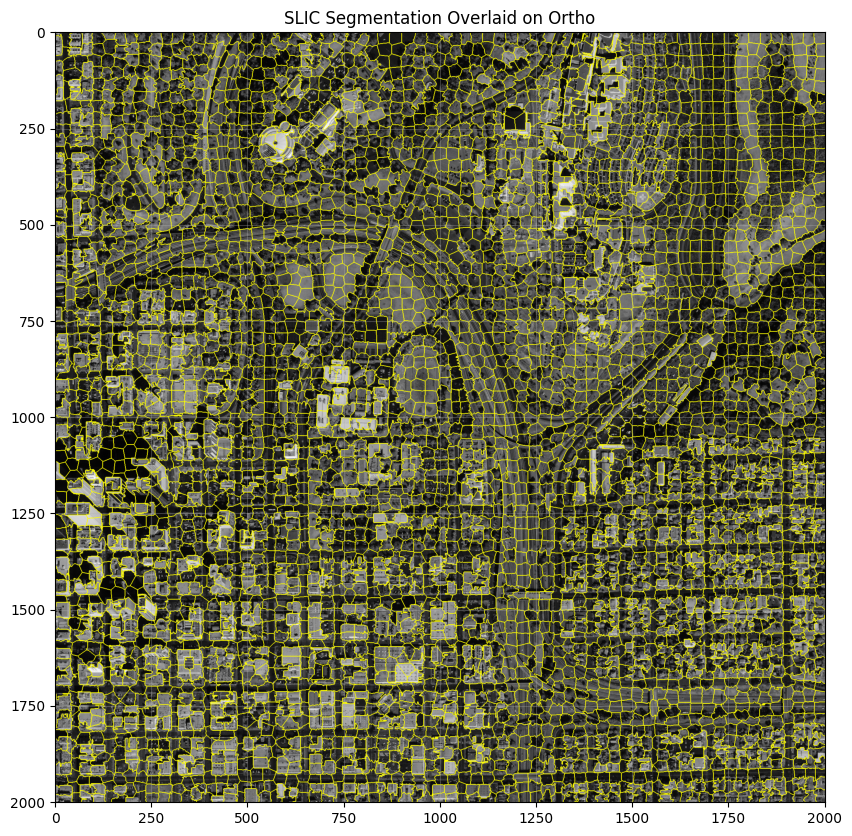

In [17]:
segmentation_layer = run_slic_segmentation(
    raster_path="po_97258_pan_0010000.tif",
    output_dir="results",
    scale=30.0,
    compactness=0.3
)

### Register indices to objects

In [33]:
import os
import geopandas as gpd
import matplotlib.pyplot as plt

from nickyspatial import (
    Layer,
    LayerManager,
    RuleSet,
    read_raster,
    attach_shape_metrics,
    attach_spectral_indices,
    attach_ndvi,  
    plot_layer,
    plot_classification,
    layer_to_vector,
    layer_to_raster,
)




In [35]:
# --- Step 1: Setup paths ---
output_dir = "results"
os.makedirs(output_dir, exist_ok=True)

raster_path = "po_97258_pan_0010000.tif"
geojson_path = "results/segment.geojson"

# --- Step 2: Load raster ---
image_array, transform, crs = read_raster(raster_path)

# --- Step 4: Add to manager ---
manager = LayerManager()
manager.add_layer(segmentation_layer)

# --- Step 5: Attach metrics ---
# segmentation_layer.attach_function(attach_shape_metrics, name="shape_metrics")
# print(segmentation_layer.objects)
segmentation_layer.attach_function(attach_shape_metrics, name="shape_metrics")
# print(segmentation_layer.objects["area_pixels"].describe())

##  Export Segments and Classification to Geojson so I can use them to pick the ids for my samples to train the classifier and used the result in the GUI

In [36]:
from copy import deepcopy
import os
import geopandas as gpd
import matplotlib.pyplot as plt

from nickyspatial import (
    Layer,
    LayerManager,
    RuleSet,
    read_raster,
    attach_shape_metrics,
    attach_spectral_indices,
    attach_ndvi,  
    plot_layer,
    plot_classification,
    layer_to_vector,
    layer_to_raster,
)
# Export segmentation layer to GeoJSON
def export_layer(layer, path):
    # Step 1: Make a deep copy of the segmentation layer
    export_layer = deepcopy(layer)
    print(export_layer)
    
    # Step 2: Reproject the copied layer's GeoDataFrame
    export_layer.objects = export_layer.objects.to_crs(epsg=4326)
    
    # Step 3: Set the copied layer's CRS metadata
    export_layer.crs = "EPSG:4326"
    
    # Step 4: Export to GeoJSON for leaflet map
    
    layer_to_vector(export_layer, output_path = path)
    print(f"Reprojected GeoJSON saved to: {path}")



In [37]:
segmentation_path = "results/segment.geojson"
#classified_path = "results/classified.geojson"
export_layer(segmentation_layer, segmentation_path)
#export_layer(classified_layer, classified_path)

Layer 'buildings_OBIA_Segments' (type: segmentation, parent: None, objects: 4461)
Reprojected GeoJSON saved to: results/segment.geojson


## Selecting Samples for Supervised Classification on the Map

### I utilized a tool created by Upendra OLi, which provides a user-friendly interface for uploading a GeoJSON file from segmentation. This tool allows me to draw random samples for each class, and it automatically generates IDs that I can use in my classification process.

In [14]:
!start cmd /k python -m http.server 8001

In [16]:
import webbrowser
webbrowser.open("http://localhost:8001/index.html")

True

In [ ]:
!start cmd /k python -m http.server 8000 --directory ortho/small_area_tiles

##  ML based classification

###  RandomForest

####  Define RandomForest Classification

In [45]:
import os
import json
import geopandas as gpd
from nickyspatial.core.layer import Layer, LayerManager
from nickyspatial.core.classifier import SupervisedClassifier
from nickyspatial import plot_classification
import matplotlib.pyplot as plt

def classify_segments_from_file(
    segment_geojson_path,
    samples_json_path=None,
    samples_dict=None,
    classifier_type="Random Forest",
    classifier_params=None,
    output_layer_name="Building_SH_Classification",
    class_field="classification",
    show_plot=True
):
    """
    Performs supervised classification on a GeoJSON segment layer using sample IDs.

    Parameters:
        segment_geojson_path (str): Path to the GeoJSON file containing segment objects.
        samples_json_path (str): Path to a JSON file with sample IDs (optional if samples_dict is given).
        samples_dict (dict): Dictionary of labeled sample IDs (e.g. { "Solar": [...], "Non-Solar": [...] }).
        classifier_type (str): Type of classifier to use (default is "Random Forest").
        classifier_params (dict): Parameters for the classifier (default is RF with 100 trees).
        output_layer_name (str): Name of the result layer.
        class_field (str): Name of the classification field in the output.
        show_plot (bool): Whether to show the classification plot.
    
    Returns:
        result_layer: Classified Layer object
        accuracy (float): Classification accuracy
        feature_importances (DataFrame or None)
    """
    # Load segment GeoJSON
    gdf = gpd.read_file(segment_geojson_path)

    # Load sample IDs
    if samples_dict is None:
        if samples_json_path is None:
            raise ValueError("Either samples_dict or samples_json_path must be provided.")
        with open(samples_json_path, "r", encoding="utf-8") as f:
            samples_dict = json.load(f)

    # Setup Layer and Manager
    layer = Layer(name="SegmentLayer", type="segmentation")
    layer.objects = gdf
    manager = LayerManager()
    manager.add_layer(layer)

    # Classifier parameters
    if classifier_params is None:
        classifier_params = {"n_estimators": 100, "oob_score": True, "random_state": 42}

    classifier = SupervisedClassifier(
        name="SolarClassifier",
        classifier_type=classifier_type,
        classifier_params=classifier_params
    )

    # Perform classification
    result_layer, accuracy, feature_importances = classifier.execute(
        source_layer=layer,
        samples=samples_dict,
        layer_manager=manager,
        layer_name=output_layer_name
    )

    # Plot result
    if show_plot:
        fig = plot_classification(result_layer, class_field=class_field)
        plt.show()

    print("Classification Accuracy:", accuracy)
    if feature_importances is not None:
        print("Top Features:\n", feature_importances.head())

    return result_layer, accuracy, feature_importances


#### Run RandomForest Classification

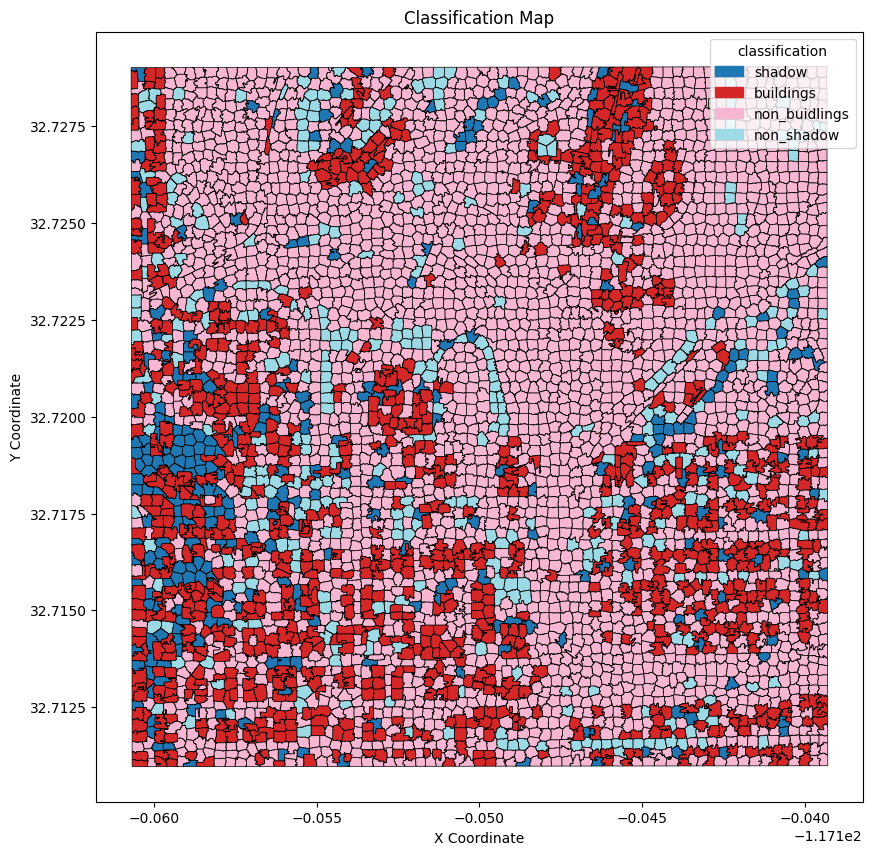

Classification Accuracy: 0.8315789473684211
Top Features:
 band_1_median    23.533964
band_1_mean      21.666542
band_1_max       19.441619
band_1_std       10.518275
band_1_min        6.006426
dtype: float64


In [46]:
result_layer_rf,_,_ = classify_segments_from_file(
    segment_geojson_path="results/segment.geojson",
    samples_json_path="results/samples.json", #you can either pass directly downloaded json or copy-paste the dictionary values inside file below.
    # samples_dict={
    #     "Solar": [1855, 2177, 2448],
    #     "Non-Solar": [7769, 5981, 5899]
    # }
)


In [47]:
classified_RF_path = "results/classified_RF.geojson"
export_layer(result_layer_rf, classified_RF_path)

Layer 'Building_SH_Classification' (type: merged, parent: SegmentLayer, objects: 4461)
Reprojected GeoJSON saved to: results/classified_RF.geojson


In [2]:
import geopandas as gpd

buildings = gpd.read_file("results/classified_RF.geojson")



In [3]:
from nickyspatial.io.vector import layer_to_vector

layer_to_vector(result_layer_rf, output_path="results/classified_RF.geojson")


NameError: name 'result_layer_rf' is not defined

In [5]:
import geopandas as gpd
gdf = gpd.read_file("results/classified_RF.geojson")
print(gdf.columns)
print(gdf.head())


Index(['segment_id', 'area_pixels', 'area_units', 'band_1_mean', 'band_1_std',
       'band_1_min', 'band_1_max', 'band_1_median', 'perimeter', 'shape_index',
       'compactness', 'classification', 'geometry'],
      dtype='object')
   segment_id  area_pixels  area_units  band_1_mean  band_1_std  band_1_min  \
0           1         1019      1019.0    41.429833   35.930690         4.0   
1           2         1236      1236.0    91.951456   61.646772         2.0   
2           3          747       747.0   133.745649   38.745068        17.0   
3           4          925       925.0    42.225946   23.746448         5.0   
4           5          572       572.0    92.622378   30.527771        11.0   

   band_1_max  band_1_median  perimeter  shape_index  compactness  \
0       196.0           26.0      216.0     1.908806     0.274458   
1       231.0           90.0      186.0     1.492447     0.448955   
2       213.0          145.0      130.0     1.341770     0.555448   
3       105.0  

In [6]:
building_gdf = buildings[buildings["classification"] == "Building"]


In [7]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Plotting

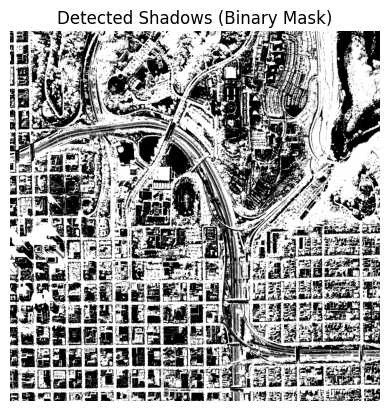

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from skimage.filters import threshold_otsu

# Load panchromatic image
with rasterio.open("po_97258_pan_0010000.tif") as src:
    pan = src.read(1)
    profile = src.profile

# Threshold to detect shadows (assuming shadows = darker)
thresh = threshold_otsu(pan)
shadow_mask = pan < thresh

# Visualize
plt.imshow(shadow_mask, cmap='gray')
plt.title("Detected Shadows (Binary Mask)")
plt.axis('off')
plt.show()


In [9]:
buildings = gdf[gdf["classification"] == "buildings"].copy()
shadows = gdf[gdf["classification"] == "shadow"].copy()


In [10]:
buildings.to_file("results/buildings.shp")
shadows.to_file("results/shadows.shp")


C:\Users\s1109438\AppData\Local\Temp\ipykernel_23424\1846410491.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  buildings.to_file("results/buildings.shp")
C:\Users\s1109438\AppData\Roaming\Python\Python312\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'area_pixels' to 'area_pixel'
  ogr_write(
C:\Users\s1109438\AppData\Roaming\Python\Python312\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'band_1_mean' to 'band_1_mea'
  ogr_write(
C:\Users\s1109438\AppData\Roaming\Python\Python312\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'band_1_median' to 'band_1_med'
  ogr_write(
C:\Users\s1109438\AppData\Roaming\Python\Python312\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'shape_index' to 'shape_inde'
  ogr_write(
C:\Users\s1109438\AppData\Roaming\Python\Python312\site-packages\pyogrio\ra

### Reproject to UTM (or suitable local metric CRS) for map visulization

In [12]:
#reproject to UTM metric crs
import geopandas as gpd
import pyproj

def reproject_to_utm(gdf):
    centroid = gdf.union_all().centroid
    #centroid = gdf.union_all.centroid
    utm_zone = int((centroid.x + 180) / 6) + 1
    utm_crs = pyproj.CRS.from_epsg(32600 + utm_zone)  # Northern Hemisphere
    return gdf.to_crs(utm_crs)

buildings_utm = reproject_to_utm(buildings)
shadows_utm = reproject_to_utm(shadows)


####  Project centroid + line toward sun azimuth to simulate a long line in the sun direction, from each building centroid, and see where it hits a shadow.

In [13]:
import numpy as np
from shapely.geometry import LineString

def project_sun_line(centroid, azimuth_deg, length=100):
    azimuth_rad = np.radians(azimuth_deg)
    dx = length * np.sin(azimuth_rad)
    dy = length * np.cos(azimuth_rad)
    return LineString([centroid, (centroid.x + dx, centroid.y + dy)])


####  Intersect projected line with shadows and looping through buildings and measure shadow lengths:

In [14]:
shadow_lengths = []

for idx, building in buildings_utm.iterrows():
    centroid = building.geometry.centroid
    sun_line = project_sun_line(centroid, 144.5, length=100)
    
    # Find first shadow that intersects
    for _, shadow in shadows_utm.iterrows():
        if sun_line.intersects(shadow.geometry):
            intersection = sun_line.intersection(shadow.geometry)
            # Take max length (in case of multipoint/lines)
            if intersection.is_empty:
                continue
            try:
                shadow_length = centroid.distance(intersection)
                shadow_lengths.append(shadow_length)
                break
            except:
                shadow_lengths.append(np.nan)
                break
    else:
        shadow_lengths.append(np.nan)


### Estimate Height

In [15]:
#compute height from each shadow length

sun_elevation_deg = 34.2
sun_elevation_rad = np.radians(sun_elevation_deg)
building_heights = [s * np.tan(sun_elevation_rad) if not np.isnan(s) else np.nan for s in shadow_lengths]


In [16]:
# Attach Results to Building GeoDataFrame

buildings_utm["shadow_length_m"] = shadow_lengths
buildings_utm["estimated_height_m"] = building_heights


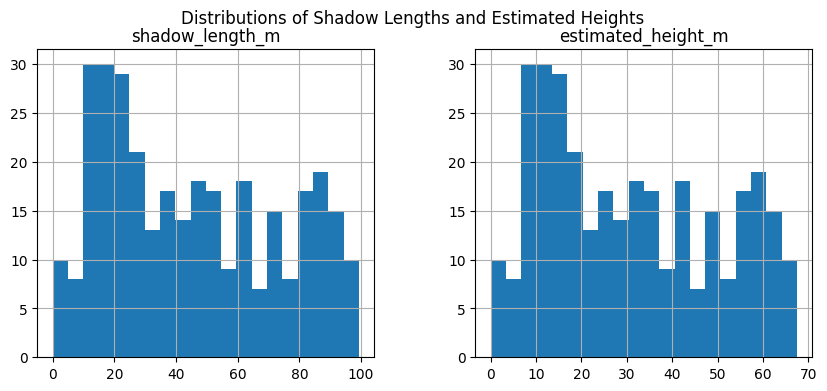

In [19]:
#Visualize and save the result

buildings_utm[["shadow_length_m", "estimated_height_m"]].hist(bins=20, figsize=(10, 4))
plt.suptitle("Distributions of Shadow Lengths and Estimated Heights")
plt.savefig("results/shadow_vs_height_histogram.png", dpi=300, bbox_inches="tight")
plt.show()


In [20]:
#save the result as geojson for GIS tools
buildings_utm.to_file("results/estimated_heights.geojson", driver="GeoJSON")


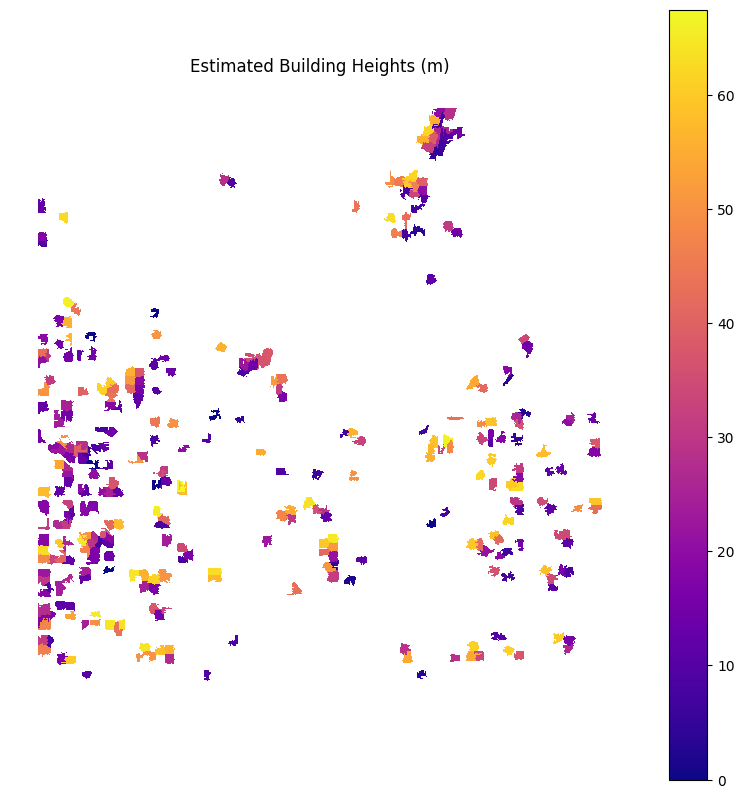

In [21]:
#plotting the building heights

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
buildings_utm.plot(column="estimated_height_m", ax=ax, cmap="plasma", legend=True)
ax.set_title("Estimated Building Heights (m)")
ax.axis("off")
plt.savefig("results/estimated_heights_map.png", dpi=300, bbox_inches="tight")
plt.show()


In [22]:
# Add Shadow Lines to the Map for Verification

from shapely.geometry import LineString
import numpy as np

def generate_shadow_line(centroid, azimuth_deg, length=100):
    azimuth_rad = np.radians(azimuth_deg)
    dx = length * np.sin(azimuth_rad)
    dy = length * np.cos(azimuth_rad)
    return LineString([centroid, (centroid.x + dx, centroid.y + dy)])

# Create GeoDataFrame of sun lines
sun_lines = buildings_utm.geometry.centroid.apply(lambda c: generate_shadow_line(c, 144.5, 100))
sun_lines_gdf = gpd.GeoDataFrame(geometry=sun_lines, crs=buildings_utm.crs)


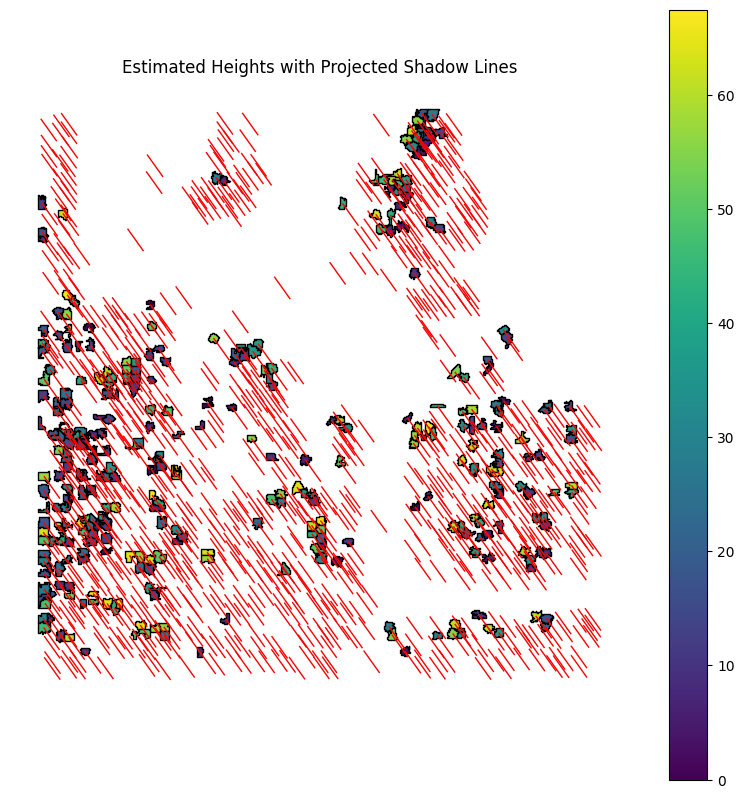

In [23]:
# plot buildings + sun lines

fig, ax = plt.subplots(figsize=(10, 10))
buildings_utm.plot(column="estimated_height_m", ax=ax, cmap="viridis", legend=True, edgecolor='black')
sun_lines_gdf.plot(ax=ax, color='red', linewidth=1)
ax.set_title("Estimated Heights with Projected Shadow Lines")
ax.axis("off")
plt.savefig("results/Estimated Heights with Projected Shadow Lines.png", dpi=300, bbox_inches="tight")
plt.show()


In [24]:
#display geodatfram table for the result
table = buildings_utm[["segment_id", "shadow_length_m", "estimated_height_m"]].dropna().round(2)
display(table)


,segment_id,shadow_length_m,estimated_height_m
47,48,29.27,19.89
48,49,41.56,28.25
69,70,11.48,7.80
76,77,81.80,55.59
151,152,91.08,61.90
...,...,...,...
4257,4258,42.08,28.59
4262,4263,88.13,59.90
4377,4378,4.93,3.35
4380,4381,13.68,9.30


In [25]:
table.to_csv("results/shadow_height_table.csv", index=False)


In [26]:
# sorting by tallest building
display(table.sort_values("estimated_height_m", ascending=False))


,segment_id,shadow_length_m,estimated_height_m
2921,2922,99.33,67.50
1485,1486,97.23,66.08
2553,2554,97.19,66.05
3125,3126,95.95,65.21
3930,3931,95.86,65.15
...,...,...,...
3201,3202,0.00,0.00
2740,2741,0.00,0.00
2346,2347,0.00,0.00
2897,2898,0.00,0.00


## Visualize estimated heights on a map using geopandas interactive map with .explore()

In [28]:
#install dependicies for geopandas interactive map with .explore()
!pip install "folium>=0.12" matplotlib mapclassify

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/882.2 kB ? eta -:--:--
   ---------------------------------------- 882.2/882.2 kB 7.9 MB/s eta 0:00:00


In [29]:
# Convert back to WGS84 for mapping
buildings_wgs = buildings_utm.to_crs(epsg=4326)

# Show the map with estimated height color
m = buildings_wgs.explore(
    column="estimated_height_m",
    cmap="plasma",
    legend=True,
    tooltip=["segment_id", "shadow_length_m", "estimated_height_m"],
    style_kwds={"fillOpacity": 0.7, "weight": 0.5}
)
m


## Another visulization on a map but using folium 

In [30]:
import geopandas as gpd
import folium
from folium import Choropleth, GeoJson, GeoJsonTooltip
from folium.raster_layers import ImageOverlay
import rasterio
from rasterio.plot import reshape_as_image
import numpy as np


In [31]:
#Reproject both layers to WGS84
buildings_wgs = buildings_utm.to_crs(epsg=4326)
shadows_wgs = shadows_utm.to_crs(epsg=4326)


In [47]:
#Create folium map

# Center the map around the buildings
center_utm = buildings_utm.geometry.centroid.union_all().centroid
center_wgs = gpd.GeoSeries([center_utm], crs=buildings_utm.crs).to_crs(epsg=4326).geometry[0]
center = [center_wgs.y, center_wgs.x]
m = folium.Map(location=center, zoom_start=18, tiles="cartodbpositron")

#m = folium.Map(location=center, zoom_start=18, tiles="cartodbpositron")


In [48]:
#Add estimated height layer

geojson_buildings = folium.GeoJson(
    buildings_wgs,
    name="Estimated Building Heights",
    tooltip=folium.GeoJsonTooltip(fields=["segment_id", "shadow_length_m", "estimated_height_m"]),
    style_function=lambda feature: {
        'fillColor': '#ff7800',
        'color': 'black',
        'weight': 0.3,
        'fillOpacity': 0.5
    }
)
geojson_buildings.add_to(m)


In [49]:
# Add shadows layer

folium.GeoJson(
    shadows_wgs,
    name="Shadows",
    style_function=lambda feature: {
        'fillColor': 'gray',
        'color': 'black',
        'weight': 0.3,
        'fillOpacity': 0.4
    }
).add_to(m)



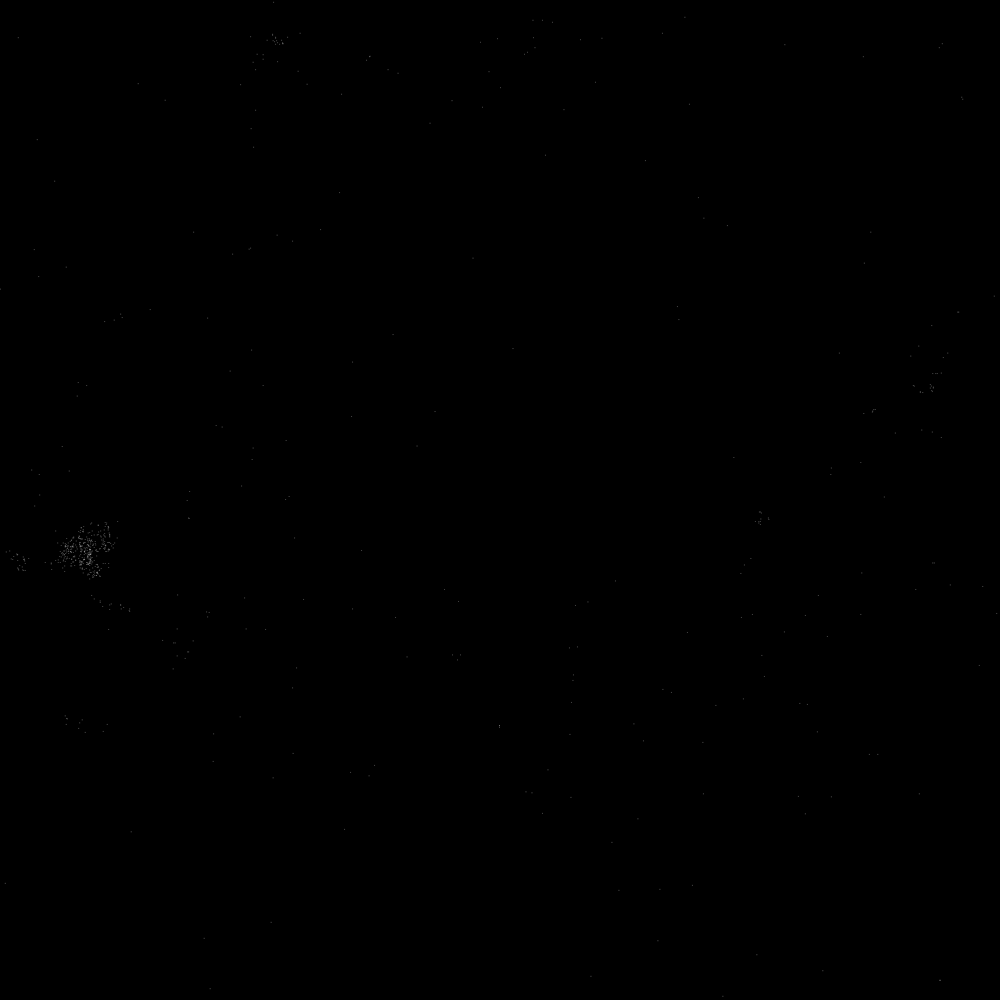

In [50]:
#Add raster (TIF) image overlay
# Open the GeoTIFF file
with rasterio.open("po_97258_pan_0010000.tif") as src:
    # Get the geographic bounding box of the image
    bounds = src.bounds
    
    # Read the first band (the panchromatic data) into a NumPy array
    img = src.read(1)

    # Clean the data by replacing any 'Not a Number' values with zero
    img = np.nan_to_num(img)

    # Normalize the pixel values to an 8-bit range (0-255) for display
    img_norm = (255 * (img - img.min()) / (img.max() - img.min())).astype(np.uint8)

    # Add the normalized 2D image array to the Folium map
    folium.raster_layers.ImageOverlay(
        image=img_norm,
        bounds=[[bounds.bottom, bounds.left], [bounds.top, bounds.right]],
        opacity=0.7,
        name="Panchromatic Image"
    ).add_to(m)

# Add a layer control to toggle the image on and off
folium.LayerControl().add_to(m)

# Display the map
m
